# <center> Майнор "Интеллектуальный анализ данных" </center>

# <center> Курс "Введение в программирование" </center>

# <center> Визуализация и первичный анализ данных </center>

## Table of contents

1. [Links](#links)
2. [Визуализация в Python](#vis)
    1. [Визуализация динамики](#dynamics)
    2. [Распределение дискретных признаков](#discrete)
    3. [Распределение непрерывных признаков](#contin)
        1. [Гистограмма](#hist)
        2. [Boxplot](#boxplot)
    4. [Визуализация зависимости](#depend)
        1. [Scatterplot](#scatter)
        2. [Heatmap](#heat)
    5. [Несколько графиков на одном](#subplot)
    6. [Сохранение изображения](#save)
    7. [Подписи осей](#labels)

## Links <a name="links"></a>

 - [Вторая статья](https://habrahabr.ru/company/ods/blog/323210/) из открытого курса ODS по машинному обучению, посвященная визуализации<br><br>
 - [Глава](https://pandas.pydata.org/pandas-docs/stable/visualization.html#) про визуализацию в Pandas в документации библиотеки<br><br>
 - [Официальный сайт](https://seaborn.pydata.org/index.html) seaborn, на котором есть документация, тьюториалы и галерея графиков<br><br>
 - Неплохой [тьюториал](https://elitedatascience.com/python-seaborn-tutorial) по seaborn<br><br>
 - [Галерея](https://python-graph-gallery.com) разнообразных графиков на python с кодом. В частности, небольшой [список](https://python-graph-gallery.com/bad-chart/) ошибок при визуализации и примеры, как их можно избежать<br><br> 

## Визуализация в Python <a name="vis"></a>

Сначала выполним все необходимые настройки и подключим библиотеки.  
Для визуализации мы будем использовать: 
 - функционал Pandas - обертка над matplotlib;
 - библиотеку `seaborn` - также надстройка над matplotlib, предоставляющая более приятный интерфейс;
 - библиотеку matplotlib

In [1]:
import numpy as np
import pandas as pd

# будем отображать графики прямо в jupyter'e
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

# стиль seaborn
# style.available выводит все доступные стили
from matplotlib import style
style.use('seaborn')

#графики в svg выглядят более четкими
%config InlineBackend.figure_format = 'svg' 

In [2]:
# увеличим дефолтный размер графиков
from matplotlib import rcParams
rcParams['figure.figsize'] = [8, 5]

In [3]:
# отключим предупреждения Anaconda
import warnings
warnings.simplefilter('ignore')

Будем практиковаться на наборе данных о продажах и оценках видеоигр: [Kaggle Dataset](https://www.kaggle.com/rush4ratio/video-game-sales-with-ratings).  
  
Описание с источника:   
Alongside the fields: Name, Platform, Year_of_Release, Genre, Publisher, NA_Sales, EU_Sales, JP_Sales, Other_Sales, Global_Sales, we have: 
- Critic_score - Aggregate score compiled by Metacritic staff
- Critic_count - The number of critics used in coming up with the Critic_score
- User_score - Score by Metacritic's subscribers
- User_count - Number of users who gave the user_score
- Developer - Party responsible for creating the game
- Rating - The [ESRB](https://www.esrb.org/) ratings  
  
Загрузим данные, определим размерность и посмотрим на сами данные

In [4]:
df = pd.read_csv("video_games_sales.csv")

In [5]:
df.shape

(16719, 16)

In [6]:
df.head()

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
0,Wii Sports,Wii,2006.0,Sports,Nintendo,41.36,28.96,3.77,8.45,82.53,76.0,51.0,8,322.0,Nintendo,E
1,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24,NaN,NaN,NaN,NaN,NaN,NaN
2,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.68,12.76,3.79,3.29,35.52,82.0,73.0,8.3,709.0,Nintendo,E
3,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.61,10.93,3.28,2.95,32.77,80.0,73.0,8,192.0,Nintendo,E
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16719 entries, 0 to 16718
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Name             16717 non-null  object 
 1   Platform         16719 non-null  object 
 2   Year_of_Release  16450 non-null  float64
 3   Genre            16717 non-null  object 
 4   Publisher        16665 non-null  object 
 5   NA_Sales         16719 non-null  float64
 6   EU_Sales         16719 non-null  float64
 7   JP_Sales         16719 non-null  float64
 8   Other_Sales      16719 non-null  float64
 9   Global_Sales     16719 non-null  float64
 10  Critic_Score     8137 non-null   float64
 11  Critic_Count     8137 non-null   float64
 12  User_Score       10015 non-null  object 
 13  User_Count       7590 non-null   float64
 14  Developer        10096 non-null  object 
 15  Rating           9950 non-null   object 
dtypes: float64(9), object(7)
memory usage: 2.0+ MB


Первое, что бросается в глаза - пропуски в данных (`NaN` в ячейках).  
Видно, что пропуски присутствуют в половине признаков. Для простоты удалим такие наблюдения.

In [8]:
df = df.dropna()

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6825 entries, 0 to 16706
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Name             6825 non-null   object 
 1   Platform         6825 non-null   object 
 2   Year_of_Release  6825 non-null   float64
 3   Genre            6825 non-null   object 
 4   Publisher        6825 non-null   object 
 5   NA_Sales         6825 non-null   float64
 6   EU_Sales         6825 non-null   float64
 7   JP_Sales         6825 non-null   float64
 8   Other_Sales      6825 non-null   float64
 9   Global_Sales     6825 non-null   float64
 10  Critic_Score     6825 non-null   float64
 11  Critic_Count     6825 non-null   float64
 12  User_Score       6825 non-null   object 
 13  User_Count       6825 non-null   float64
 14  Developer        6825 non-null   object 
 15  Rating           6825 non-null   object 
dtypes: float64(9), object(7)
memory usage: 906.4+ KB


Объем данных заметно уменьшился.  
Теперь посмотрим на количество уникальных игр в датасете.  
Спойлер: их заметно меньше, чем число наблюдений. Сразу найдем все игры, которые встречаются более одного раза, и посмотрим на одну из них в качестве примера.

In [10]:
df.Name.nunique()

4377

In [11]:
names = df.Name.value_counts()
names[names > 1]

Madden NFL 07                              8
Need for Speed: Most Wanted                8
LEGO Star Wars II: The Original Trilogy    8
The Sims 2                                 7
Terraria                                   7
                                          ..
Major League Baseball 2K12                 2
El Shaddai: Ascension of the Metatron      2
NBA 08                                     2
Hatsune Miku: Project Diva f               2
N+                                         2
Name: Name, Length: 1412, dtype: int64

In [12]:
df[df.Name == 'Need for Speed: Most Wanted']

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
253,Need for Speed: Most Wanted,PS2,2005.0,Racing,Electronic Arts,2.03,1.79,0.08,0.47,4.37,82.0,36.0,9.1,137.0,EA Canada,T
1190,Need for Speed: Most Wanted,X360,2012.0,Racing,Electronic Arts,0.62,0.78,0.01,0.15,1.56,83.0,54.0,8.5,134.0,EA Canada,T
1591,Need for Speed: Most Wanted,X360,2005.0,Racing,Electronic Arts,1.00,0.13,0.02,0.10,1.25,83.0,54.0,8.5,134.0,EA Canada,T
1998,Need for Speed: Most Wanted,XB,2005.0,Racing,Electronic Arts,0.53,0.46,0.00,0.05,1.04,83.0,32.0,8.8,29.0,EA Canada,T
3581,Need for Speed: Most Wanted,GC,2005.0,Racing,Electronic Arts,0.43,0.11,0.00,0.02,0.56,80.0,18.0,9.1,22.0,EA Canada,T
5973,Need for Speed: Most Wanted,PC,2005.0,Racing,Electronic Arts,0.02,0.23,0.00,0.04,0.29,82.0,19.0,8.5,525.0,Black Box,T
6411,Need for Speed: Most Wanted,DS,2005.0,Racing,Electronic Arts,0.24,0.01,0.00,0.02,0.27,45.0,4.0,6.1,22.0,EA Canada,E
11716,Need for Speed: Most Wanted,PC,2012.0,Racing,Electronic Arts,0.00,0.06,0.00,0.02,0.08,82.0,19.0,8.5,525.0,Black Box,T


Судя по данным, одна и та же игра может быть представлена на различных платформах, и также могут быть перезапуски (более поздний год).  
  
Поменяем типы некоторых признаков перед основной работой, т.к. при чтении они были определены неверно с нашей точки зрения.

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6825 entries, 0 to 16706
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Name             6825 non-null   object 
 1   Platform         6825 non-null   object 
 2   Year_of_Release  6825 non-null   float64
 3   Genre            6825 non-null   object 
 4   Publisher        6825 non-null   object 
 5   NA_Sales         6825 non-null   float64
 6   EU_Sales         6825 non-null   float64
 7   JP_Sales         6825 non-null   float64
 8   Other_Sales      6825 non-null   float64
 9   Global_Sales     6825 non-null   float64
 10  Critic_Score     6825 non-null   float64
 11  Critic_Count     6825 non-null   float64
 12  User_Score       6825 non-null   object 
 13  User_Count       6825 non-null   float64
 14  Developer        6825 non-null   object 
 15  Rating           6825 non-null   object 
dtypes: float64(9), object(7)
memory usage: 906.4+ KB


In [14]:
df['User_Score'] = df.User_Score.astype('float64')
df['Year_of_Release'] = df.Year_of_Release.astype('int64')
df['User_Count'] = df.User_Count.astype('int64')
df['Critic_Count'] = df.Critic_Count.astype('int64')

In [15]:
df.describe()

,Year_of_Release,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count
count,6825.000000,6825.000000,6825.000000,6825.000000,6825.000000,6825.000000,6825.000000,6825.000000,6825.000000,6825.000000
mean,2007.436777,0.394484,0.236089,0.064158,0.082677,0.777590,70.272088,28.931136,7.185626,174.722344
std,4.211248,0.967385,0.687330,0.287570,0.269871,1.963443,13.868572,19.224165,1.439942,587.428538
min,1985.000000,0.000000,0.000000,0.000000,0.000000,0.010000,13.000000,3.000000,0.500000,4.000000
25%,2004.000000,0.060000,0.020000,0.000000,0.010000,0.110000,62.000000,14.000000,6.500000,11.000000
50%,2007.000000,0.150000,0.060000,0.000000,0.020000,0.290000,72.000000,25.000000,7.500000,27.000000
75%,2011.000000,0.390000,0.210000,0.010000,0.070000,0.750000,80.000000,39.000000,8.200000,89.000000
max,2016.000000,41.360000,28.960000,6.500000,10.570000,82.530000,98.000000,113.000000,9.600000,10665.000000


In [16]:
df.describe(include=['object'])

,Name,Platform,Genre,Publisher,Developer,Rating
count,6825,6825,6825,6825,6825,6825
unique,4377,17,12,262,1289,7
top,Madden NFL 07,PS2,Action,Electronic Arts,EA Canada,T
freq,8,1140,1630,944,149,2377


In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6825 entries, 0 to 16706
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Name             6825 non-null   object 
 1   Platform         6825 non-null   object 
 2   Year_of_Release  6825 non-null   int64  
 3   Genre            6825 non-null   object 
 4   Publisher        6825 non-null   object 
 5   NA_Sales         6825 non-null   float64
 6   EU_Sales         6825 non-null   float64
 7   JP_Sales         6825 non-null   float64
 8   Other_Sales      6825 non-null   float64
 9   Global_Sales     6825 non-null   float64
 10  Critic_Score     6825 non-null   float64
 11  Critic_Count     6825 non-null   int64  
 12  User_Score       6825 non-null   float64
 13  User_Count       6825 non-null   int64  
 14  Developer        6825 non-null   object 
 15  Rating           6825 non-null   object 
dtypes: float64(7), int64(3), object(6)
memory usage: 906.4+ KB


### Визуализация динамики <a name="dynamics"></a>

Для визуализации динамики лучше всего подходит стандартный `lineplot`.  
Метод `plot()` в Pandas строит график для каждого столбца, разделяя их по цветам, и добавляет легенду. Удобно. 

In [18]:
# Просто все признаки, отвечающие за продажи
# В данном случае, они содержат в имени Sales
[x for x in df.columns if 'Sales' in x]

['NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales', 'Global_Sales']

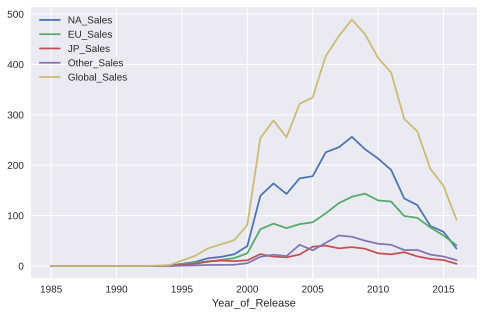

In [19]:
sales_df = df[[x for x in df.columns if 'Sales' in x] + ['Year_of_Release']]
sales_df.groupby('Year_of_Release').sum().plot()
plt.show()

Если признаков много, на одном графике они могут смешаться в кучу и получится `spaghetti plot`, на котором очень сложно что-то увидеть.  В таких случаях имеет смысл отобразить каждый признак на отдельном подграфе.  

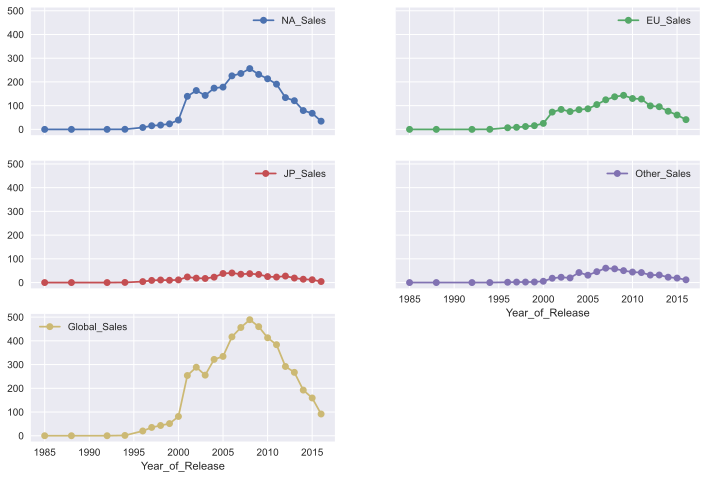

In [ ]:
sales_df.groupby('Year_of_Release').sum().plot(subplots=True, 
                                               layout=(3, 2), 
                                               sharex=True, 
                                               sharey=True,
                                               figsize=(12,8),
                                               linestyle='-', 
                                               marker='o')
plt.show()

### Задание

**Постройте график или несколько, показывающий число игр, выпущенных в каждый год в общем и с разбивкой:**  
  
&nbsp;&nbsp;&nbsp;&nbsp;**- по жанру**  
&nbsp;&nbsp;&nbsp;&nbsp;**- по возрастному рейтингу**

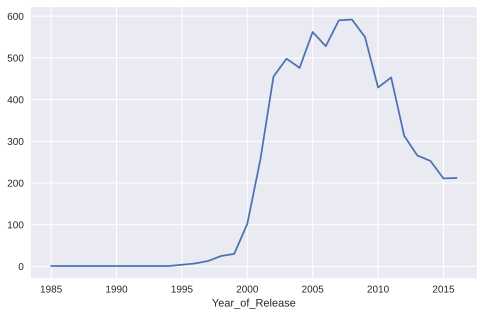

In [20]:
df.groupby('Year_of_Release').size().plot()

array([[<AxesSubplot:xlabel='Year_of_Release'>,
        <AxesSubplot:xlabel='Year_of_Release'>],
       [<AxesSubplot:xlabel='Year_of_Release'>,
        <AxesSubplot:xlabel='Year_of_Release'>],
       [<AxesSubplot:xlabel='Year_of_Release'>,
        <AxesSubplot:xlabel='Year_of_Release'>],
       [<AxesSubplot:xlabel='Year_of_Release'>,
        <AxesSubplot:xlabel='Year_of_Release'>],
       [<AxesSubplot:xlabel='Year_of_Release'>,
        <AxesSubplot:xlabel='Year_of_Release'>],
       [<AxesSubplot:xlabel='Year_of_Release'>,
        <AxesSubplot:xlabel='Year_of_Release'>]], dtype=object)

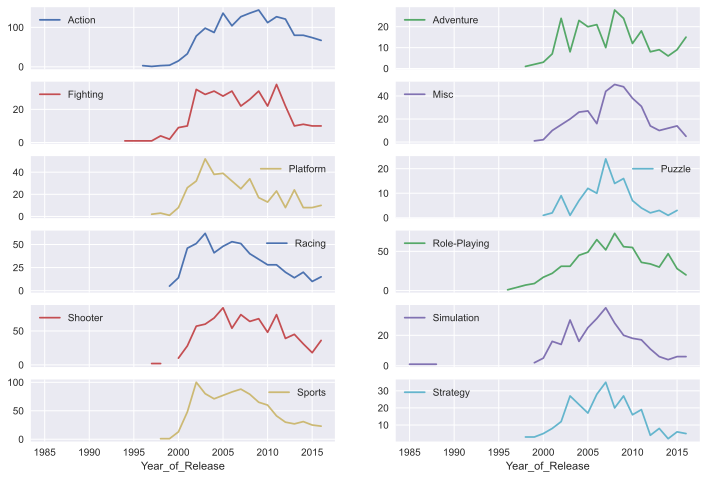

In [ ]:
pd.crosstab(
    index=df.Year_of_Release,
    columns=df.Genre, 
    values=df.Genre, 
    aggfunc='count').plot(subplots=True, layout=(6, 2), figsize=(12, 8))

array([[<AxesSubplot:xlabel='Year_of_Release'>,
        <AxesSubplot:xlabel='Year_of_Release'>],
       [<AxesSubplot:xlabel='Year_of_Release'>,
        <AxesSubplot:xlabel='Year_of_Release'>],
       [<AxesSubplot:xlabel='Year_of_Release'>,
        <AxesSubplot:xlabel='Year_of_Release'>],
       [<AxesSubplot:xlabel='Year_of_Release'>,
        <AxesSubplot:xlabel='Year_of_Release'>]], dtype=object)

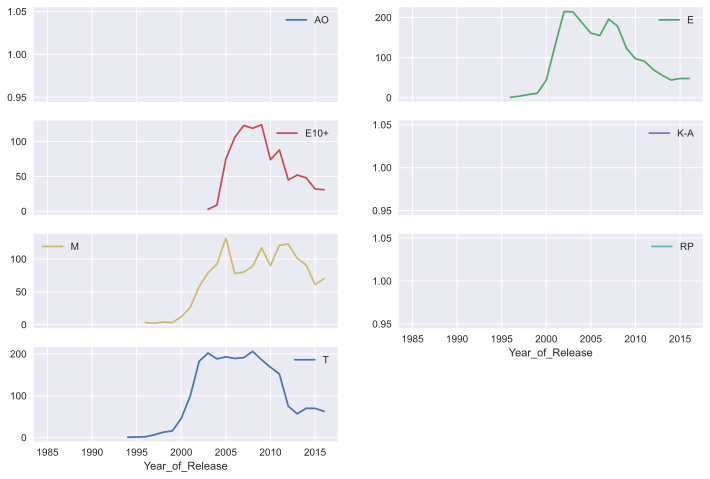

In [ ]:
pd.crosstab(
    index=df.Year_of_Release,
    columns=df.Rating,
    values=df.Rating,
    aggfunc='count').plot(subplots=True, layout=(4, 2), figsize=(12, 8))

### Задание

**Провизуализируйте динамику по годам средней оценки пользователей в общем и с разбивкой:**  
  
&nbsp;&nbsp;&nbsp;&nbsp;**- по жанру**  
&nbsp;&nbsp;&nbsp;&nbsp;**- по возрастному рейтингу**

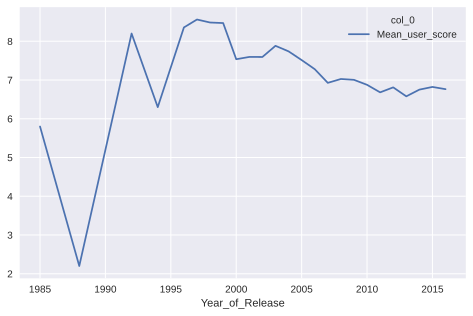

In [21]:
pd.crosstab(
    index=df.Year_of_Release,
    columns=['Mean_user_score'],
    values=df.User_Score,
    aggfunc='mean').plot()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f7b3ea5bf98>,
      dtype=object)

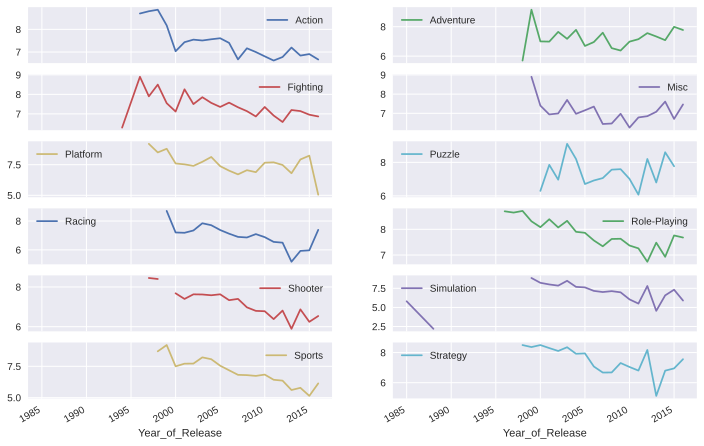

In [22]:
pd.crosstab(
    index=df.Year_of_Release,
    columns=df.Genre,
    values=df.User_Score,
    aggfunc='mean').plot(subplots=True, layout=(6, 2), figsize=(12, 8))

array([[<AxesSubplot:xlabel='Year_of_Release'>,
        <AxesSubplot:xlabel='Year_of_Release'>],
       [<AxesSubplot:xlabel='Year_of_Release'>,
        <AxesSubplot:xlabel='Year_of_Release'>],
       [<AxesSubplot:xlabel='Year_of_Release'>,
        <AxesSubplot:xlabel='Year_of_Release'>],
       [<AxesSubplot:xlabel='Year_of_Release'>,
        <AxesSubplot:xlabel='Year_of_Release'>]], dtype=object)

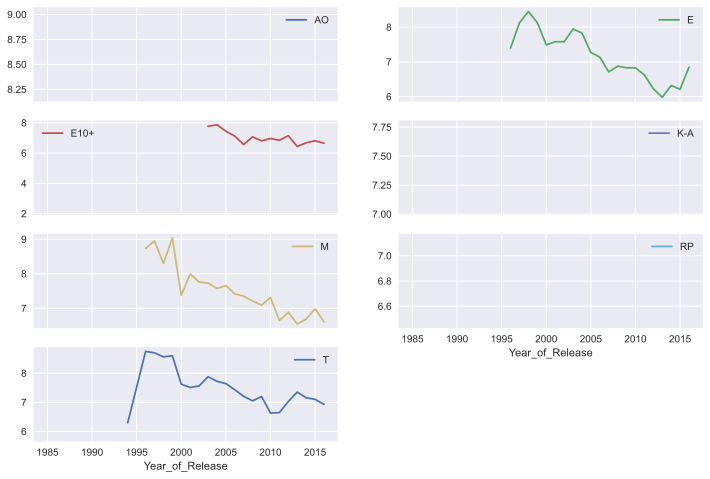

In [ ]:
pd.crosstab(
    index=df.Year_of_Release,
    columns=df.Rating,
    values=df.User_Score,
    aggfunc='mean').plot(subplots=True, layout=(4, 2), figsize=(12, 8))

### Распределение дискретных признаков <a name="discrete"></a>

Для визуализации распределения категориальных признаков хорошо подходит `barplot`. По сути, для каждой категории он строит столбик (bar) высотой равной количеству наблюдений, в которых это значение встретилось. 

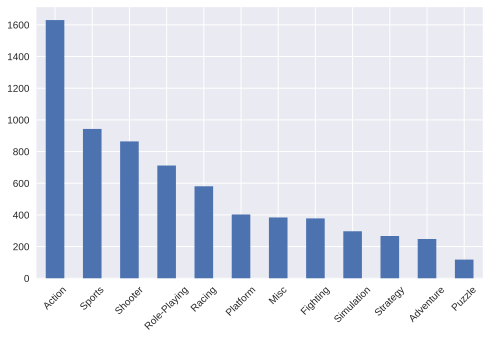

In [40]:
# rot отвечает за угол наклона подписей значений на оси x
df.Genre.value_counts().plot(kind='bar', rot=45) 
plt.show()

Вместо bar'ов можно построить `lollipop plot`.

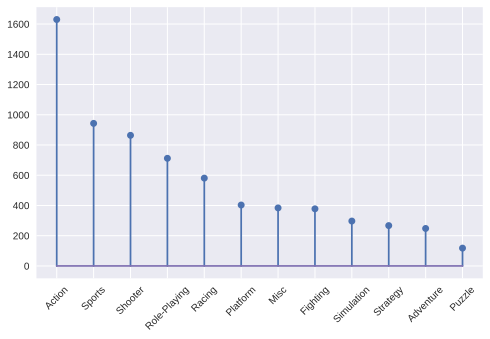

In [24]:
n_obs = df.Genre.value_counts()
genres = n_obs.index.values
plt.stem(n_obs)
plt.xticks(range(len(genres)), genres, rotation=45)
plt.show()

Популярной альтернативой `barplot` является `pieplot`. Однако этот тип графика скорее вреден, т.к. он искажает представление о соотношении долей категорий (так говорят). В данном случае еще и цвета у категорий совпадают.

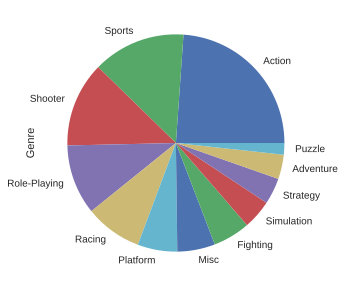

In [25]:
df.Genre.value_counts().plot(kind='pie')
plt.show()

Можно немного модифицировать график, превратив его в `doughnut plot`. Стало немного лучше, но кардинально ничего не изменилось.  
  
В общем, посыл такой - не использовать `pieplot` и его вариации.

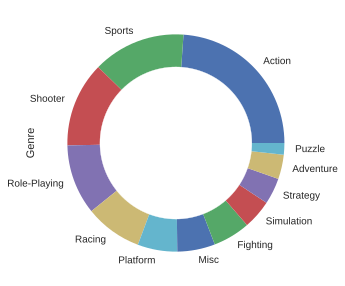

In [26]:
df.Genre.value_counts().plot(kind='pie')
plt.gcf().gca().add_artist(plt.Circle((0,0), 0.7, color='white'))
plt.show()

Очень удобное свойство `barplot` - на графике можно посмотреть распределение сразу по нескольким признакам. Ниже в примере показаны продажи для каждого жанра. 

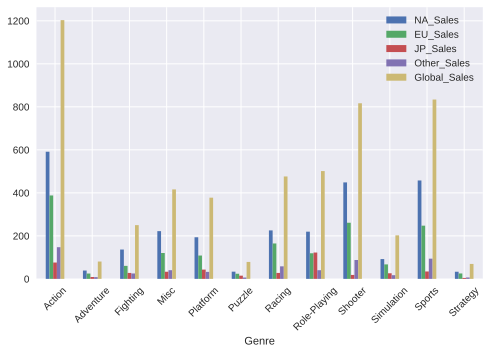

In [27]:
df[[x for x in df.columns if 'Sales' in x] + ['Genre']].groupby('Genre').sum().plot(kind='bar', rot=45)
plt.show()

В таком виде анализировать график тяжело. Как и в случае с `lineplot`, удобнее разбить его на несколько графиков.  
В таком виде информация представлена нагляднее. Например, можно сразу заметить, что продажи по жанрам распределены примерно одинаково везде, кроме Японии - там проявляют особый интерес к RPG и не любят шутеры.

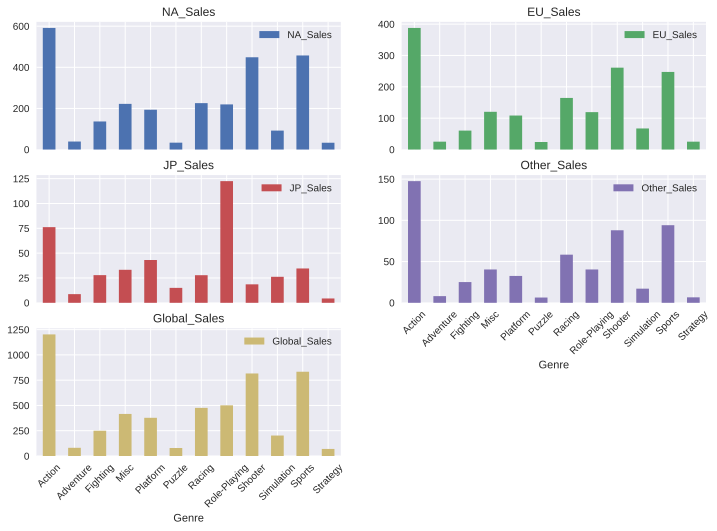

In [28]:
df[[x for x in df.columns if 'Sales' in x] + ['Genre']].groupby('Genre').sum().plot(subplots=True, 
                                                                                    layout=(3, 2), 
                                                                                    kind='bar', 
                                                                                    rot = 45,
                                                                                    figsize=(12,8))
plt.show()

С помощью метода `transpose()`  можно транспонировать датафрейм, т.е. поменять местами оси.

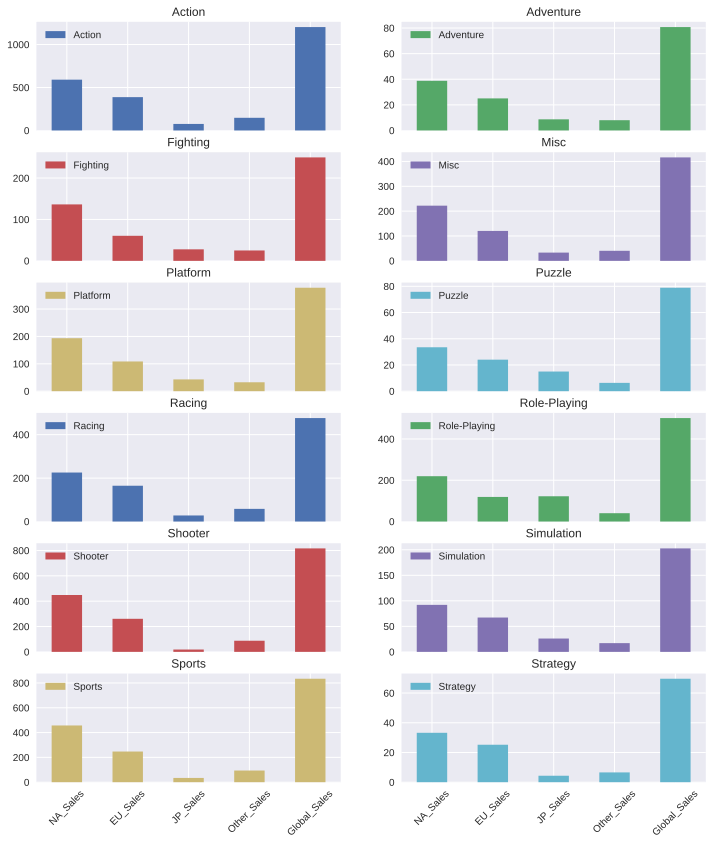

In [29]:
df[[x for x in df.columns if 'Sales' in x] + 
   ['Genre']].groupby('Genre').sum().transpose().plot(subplots=True, 
                                                      layout=(6, 2), 
                                                      kind='bar', 
                                                      rot = 45,
                                                      figsize=(12,14))
plt.show()

Для построения `barplot`  мы использовали посчитанные значения для каждой категории. Фактически, мы передавали методу `plot()` индексированный массив.  
  
Функции `countplot()` и `factorplot()` из библиотеки seaborn позволяют передавать им обычный набор данных, и берут на себя подсчет числа наблюдений для каждой категории.  
Для примера посмотрим на число наблюдений с пропущенными значениями в зависимости от жанра или платформы.

In [30]:
df_orig = pd.read_csv("video_games_sales.csv")

In [31]:
print(sum(pd.isna(df_orig.Genre)))
print(sum(pd.isna(df_orig.Name)))

2
2


In [32]:
df_orig[pd.isnull(df_orig.Name)]

,Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating
659,NaN,GEN,1993.0,NaN,Acclaim Entertainment,1.78,0.53,0.00,0.08,2.39,NaN,NaN,NaN,NaN,NaN,NaN
14246,NaN,GEN,1993.0,NaN,Acclaim Entertainment,0.00,0.00,0.03,0.00,0.03,NaN,NaN,NaN,NaN,NaN,NaN


In [33]:
df_new = df_orig.dropna(subset=['Name', 'Genre'], how='any')
np.shape(df_new)

(16717, 16)

In [34]:
# Создаем новый признак nan_exist со значениями True и False если для наблюдения соотвественно есть или нет 
# пропущенные значения хотя бы по одному признаку
df_new['nan_exist'] = df_new.drop(['Name', 'Genre'], axis=1).isnull().any(axis=1)

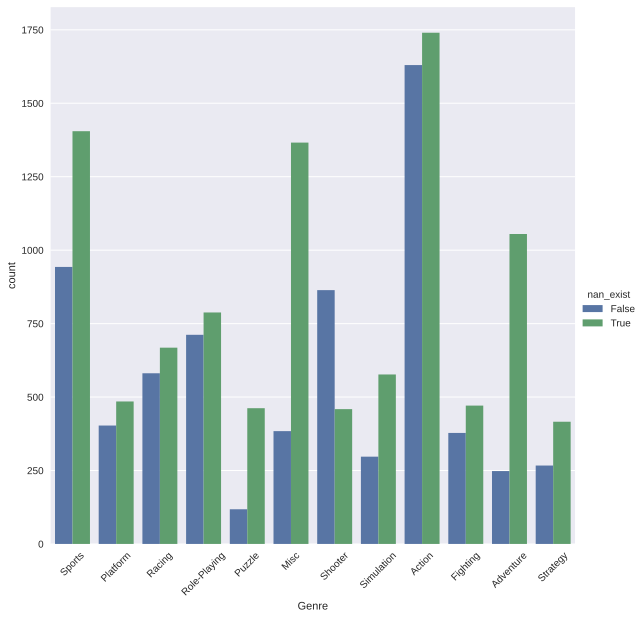

In [35]:
sns.factorplot(x='Genre', hue='nan_exist', data=df_new, kind='count', size = 8).set_xticklabels(rotation=45)
plt.show()


Missing values in Platform: 0 




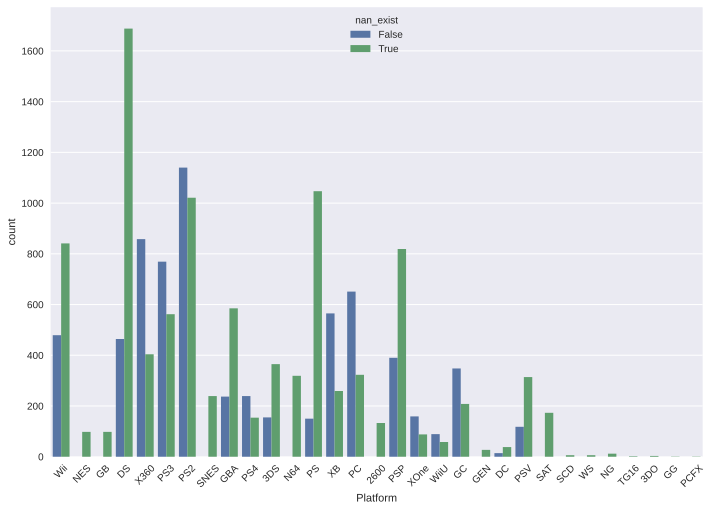

In [36]:
print('\nMissing values in Platform:', sum(pd.isnull(df_new.Platform)), '\n\n')

plt.figure(figsize=(11.7, 8.27))
sns.countplot(x='Platform', hue='nan_exist', data=df_new)
plt.xticks(rotation=45)
plt.show() # при таком выводе не выводится лишняя информация от matplotlib

По умолчанию категории упорядочены по тому, какая раньше встретилась в наборе данных. Порядок можно поменять с помощью аргумента `order`.  
Можно, например, отсортировать в лексикографическом порядке. 

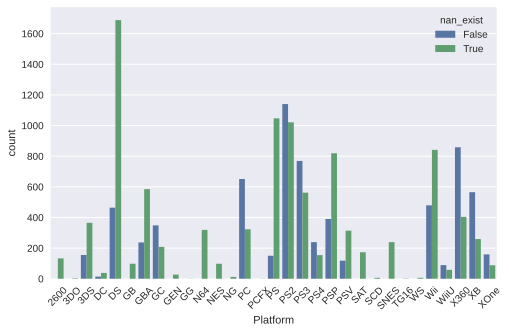

In [37]:
plt.figure(figsize=(8,5))
sns.countplot(x='Platform', hue='nan_exist', data=df_new, order=sorted(df_new.Platform.unique()))
plt.xticks(rotation=45)
plt.show()

Или в случайном порядке:

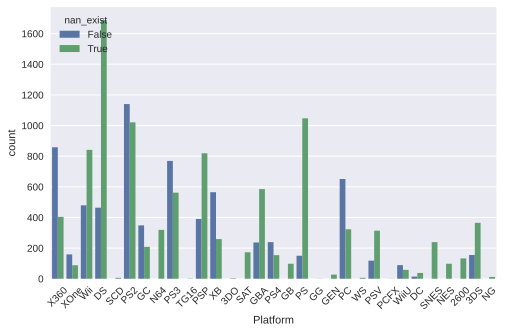

In [38]:
from random import shuffle
x = df_new.Platform.unique()
plt.figure(figsize=(8,5))
shuffle(x) # изменяет объект (перемешивает элементы), возвращает None
sns.countplot(x='Platform', hue='nan_exist', data=df_new, order=x)
plt.xticks(rotation=45)
plt.show()

Или по убыванию величины категории. Но использовать для этого `countplot` не всегда разумно, т.к. все равно приходится вызывать `value_counts()`.

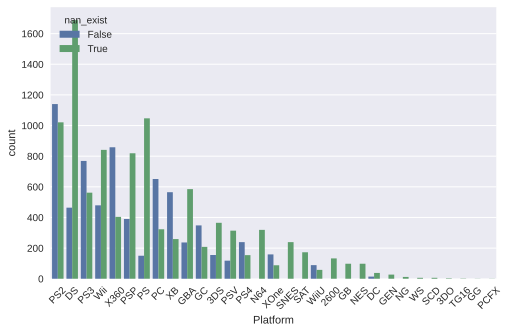

In [39]:
sns.countplot(x='Platform', hue='nan_exist', data=df_new, order=df_new.Platform.value_counts().index)
plt.xticks(rotation=45)
plt.show()

### Задание
  
**Постройте график или несколько, показывающий число игр, выпущенных в каждый год в общем и с разбивкой:**  
  
&nbsp;&nbsp;&nbsp;&nbsp;**- по жанру**  
&nbsp;&nbsp;&nbsp;&nbsp;**- по возрастному рейтингу**    

**Выполните задание, используя `barplot`.**

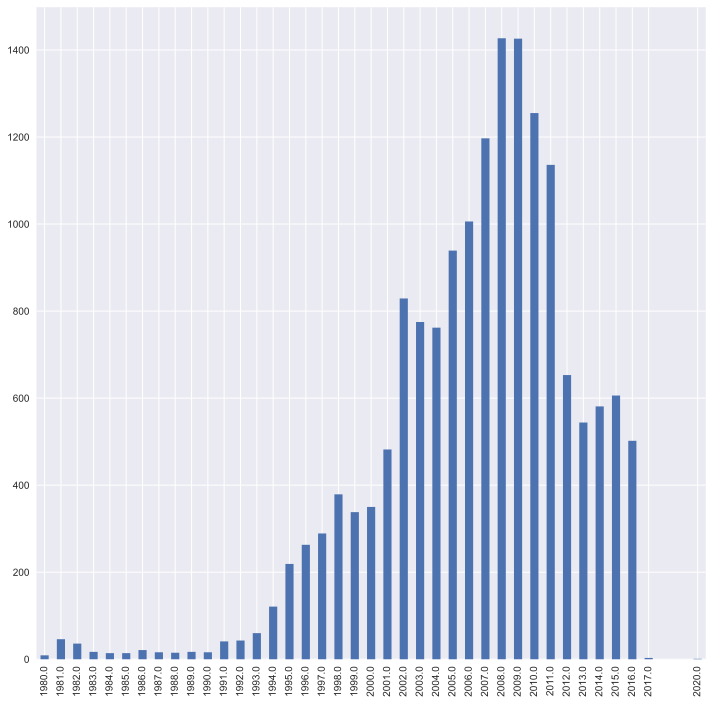

In [ ]:
df_new.Year_of_Release.value_counts().plot(kind='bar', figsize=(12, 12))
plt.show()

array([[<AxesSubplot:title={'center':'Action'}, xlabel='Year_of_Release'>,
        <AxesSubplot:title={'center':'Adventure'}, xlabel='Year_of_Release'>],
       [<AxesSubplot:title={'center':'Fighting'}, xlabel='Year_of_Release'>,
        <AxesSubplot:title={'center':'Misc'}, xlabel='Year_of_Release'>],
       [<AxesSubplot:title={'center':'Platform'}, xlabel='Year_of_Release'>,
        <AxesSubplot:title={'center':'Puzzle'}, xlabel='Year_of_Release'>],
       [<AxesSubplot:title={'center':'Racing'}, xlabel='Year_of_Release'>,
        <AxesSubplot:title={'center':'Role-Playing'}, xlabel='Year_of_Release'>],
       [<AxesSubplot:title={'center':'Shooter'}, xlabel='Year_of_Release'>,
        <AxesSubplot:title={'center':'Simulation'}, xlabel='Year_of_Release'>],
       [<AxesSubplot:title={'center':'Sports'}, xlabel='Year_of_Release'>,
        <AxesSubplot:title={'center':'Strategy'}, xlabel='Year_of_Release'>]],
      dtype=object)

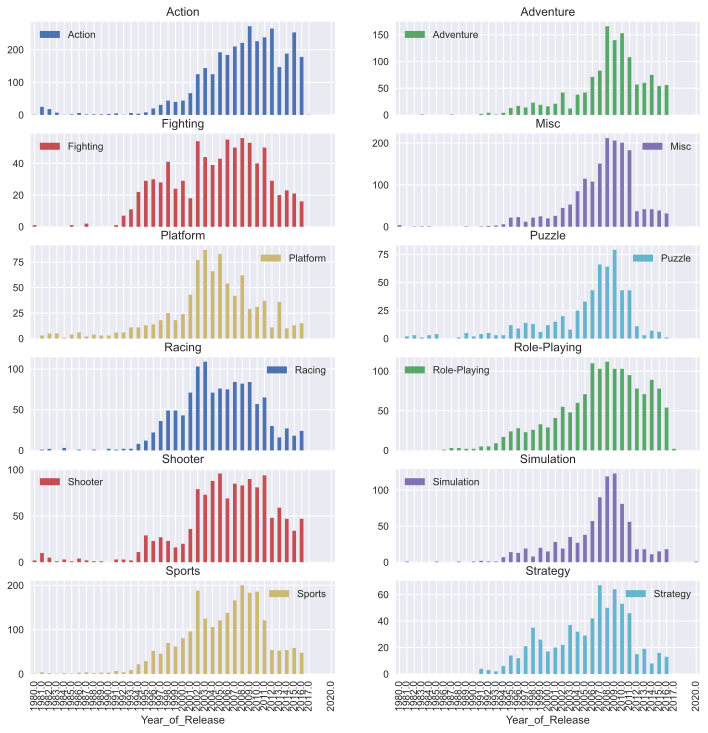

In [ ]:
pd.crosstab(
    index=df_new.Year_of_Release,
    columns=df_new.Genre, 
    values=df_new.Genre, 
    aggfunc='count').plot(kind='bar', subplots=True, layout=(6, 2), figsize=(12, 12))

array([[<AxesSubplot:title={'center':'AO'}, xlabel='Year_of_Release'>,
        <AxesSubplot:title={'center':'E'}, xlabel='Year_of_Release'>],
       [<AxesSubplot:title={'center':'E10+'}, xlabel='Year_of_Release'>,
        <AxesSubplot:title={'center':'EC'}, xlabel='Year_of_Release'>],
       [<AxesSubplot:title={'center':'K-A'}, xlabel='Year_of_Release'>,
        <AxesSubplot:title={'center':'M'}, xlabel='Year_of_Release'>],
       [<AxesSubplot:title={'center':'RP'}, xlabel='Year_of_Release'>,
        <AxesSubplot:title={'center':'T'}, xlabel='Year_of_Release'>]],
      dtype=object)

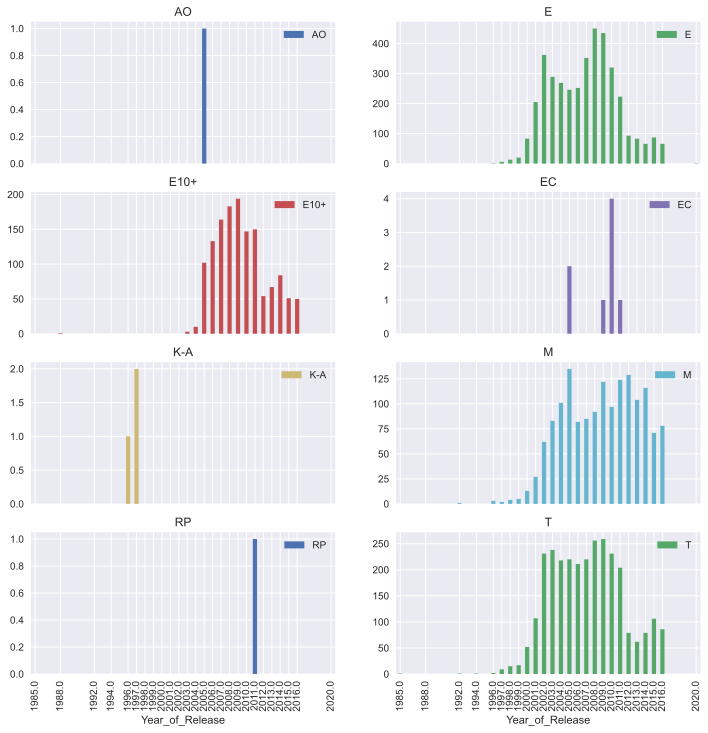

In [ ]:
pd.crosstab(
    index=df_new.Year_of_Release,
    columns=df_new.Rating, 
    values=df_new.Rating, 
    aggfunc='count').plot(kind='bar', subplots=True, layout=(4, 2), figsize=(12, 12))

## Распределение непрерывных признаков <a name="contin"></a>

### Гистограмма <a name="hist"></a>

Гистограмма позволяет оценить распределение непрерывной величины, разбивая интервал значений на несколько интервалов и считая, сколько наблюдений попало в каждый из интервалов, аналогично `bar plot`.  
Для правильной оценки распределения важно выбрать число интервалов (они, как правило, равны). Чаще всего по умолчанию используют число интервалов равное $\sqrt{x_{max}}$, где $x_{max}$ - наибольшее наблюдаемое значение.

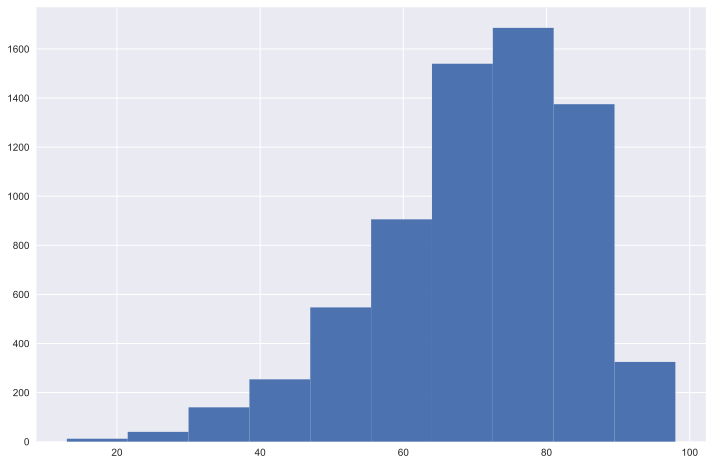

In [ ]:
df.Critic_Score.hist(figsize=(12,8))
plt.show()

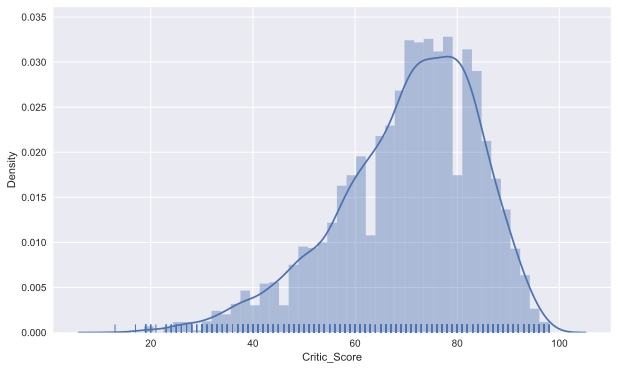

In [ ]:
plt.figure(figsize=(10, 6))
'''
    Аргумент kde (по умолчанию True) указывает, что мы строим плотность распределения на основе гистограммы
    Если изменить на False, будет просто гистограмма
    Аргумент rug (False by default) отвечает за отображение наблюдений ('палочки' снизу графика)
'''
sns.distplot(df['Critic_Score'], kde=True, rug=True)
plt.show()

Можно построить гистрограмму признака с разбивкой по группам, что позволит оценить распределение признака в каждой группе и сравнить между собой. Но т.к. границы значений наблюдений в каждой группе могут отличаться, гистограммы также будут построены с разными параметрами - числом столбцов и их шириной.

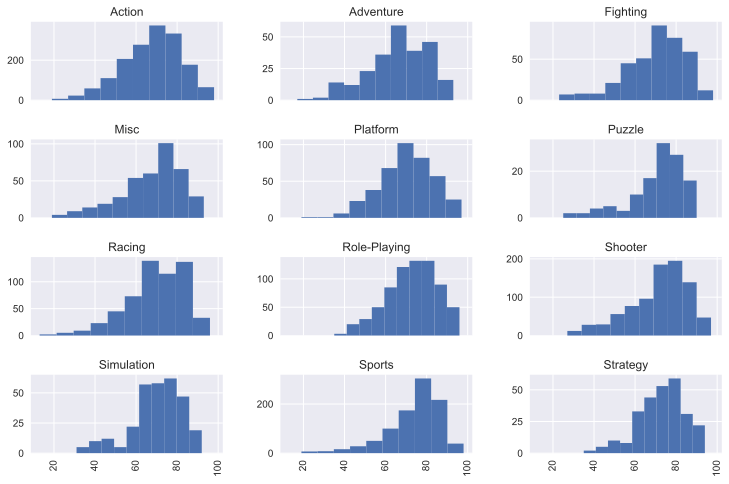

In [ ]:
# разбиение по умолчанию
df[['Critic_Score']].hist(by=df.Genre, figsize=(12,8), sharex=True)
plt.show()

Можно явно задать число столбцов в гистограмме (`bins`). Тем не менее, они будут по-прежнему отличаться шириной.

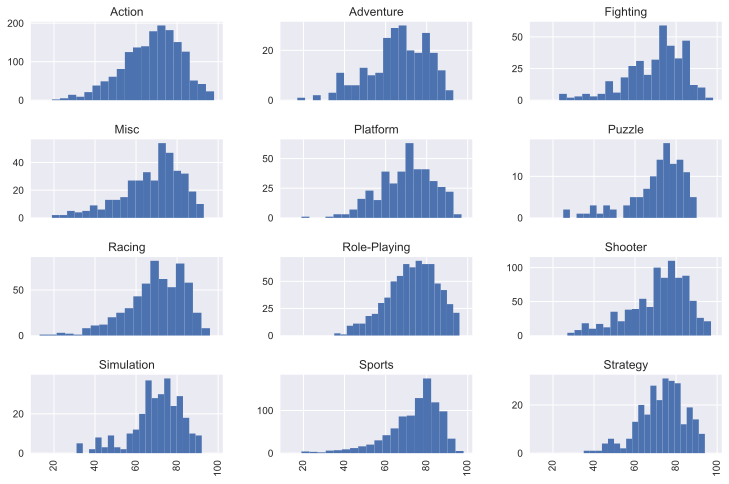

In [ ]:
# фиксированное число разбиений
df[['Critic_Score']].hist(by=df.Genre, figsize=(12,8), sharex=True, bins=20)
plt.show()

Также можно арументу `bins` вместо числа столбцов передать сами интервалы - массив из n+1 значений, где n - число интервалов. При этом, интервалы могут быть разного размера.  
В таком случае гистограммы для разных групп будут синхронизированы.  
  
Гистограммы позволяют оценить распределение в целом, сделать выводы о принаджлежности распределения к одному из известных, и заметить отклонения. Например, на графиках распределения напоминают нормальное, но средние значения сильно смещены вправо, при этом распределения имеют длинные левые хвосты.  

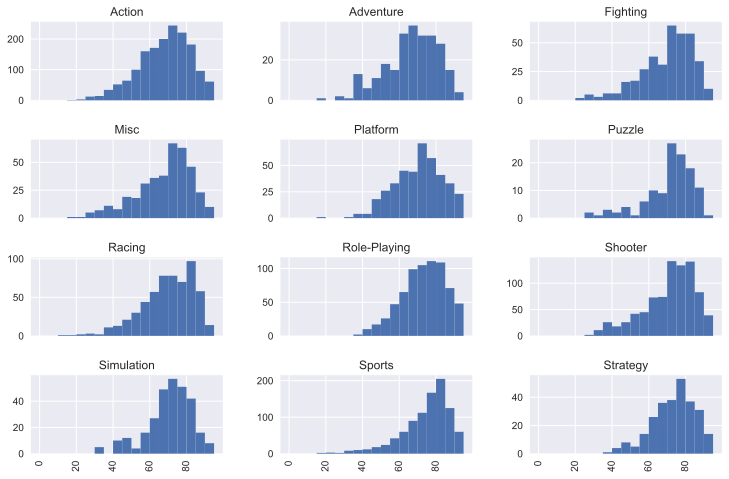

In [ ]:
# фиксированные интервалы
# от 0 до максимального значения признака с шагом 5
# +1 для того, чтобы максимальное значение вошло в интервал
df[['Critic_Score']].hist(by=df.Genre, 
                          figsize=(12,8), 
                          sharex=True,
                          bins=np.array(range(0,max(df.Critic_Score.astype('int64')) + 1, 5)))
plt.show()

### Задание
  
__Постройте гистрограмму числа пользователей.<br> Также постройте с разбивкой по возрастному рейтингу. Используйте одни и те же интервалы в каждой из гистограмм.__ 

Число пользователей к чему?

array([[<AxesSubplot:title={'center':'User_Count'}>]], dtype=object)

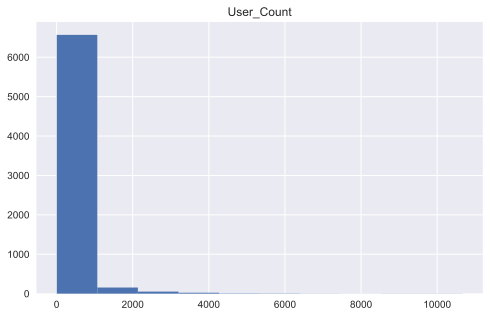

In [ ]:
df[['User_Count']].hist()

array([[<AxesSubplot:title={'center':'AO'}>,
        <AxesSubplot:title={'center':'E'}>,
        <AxesSubplot:title={'center':'E10+'}>],
       [<AxesSubplot:title={'center':'K-A'}>,
        <AxesSubplot:title={'center':'M'}>,
        <AxesSubplot:title={'center':'RP'}>],
       [<AxesSubplot:title={'center':'T'}>, <AxesSubplot:>,
        <AxesSubplot:>]], dtype=object)

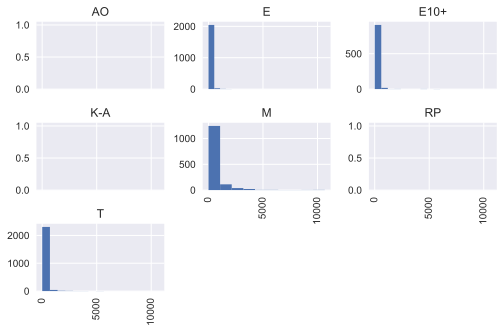

In [ ]:
df[['User_Count']].hist(by=df.Rating, sharex=True)

### Boxplot <a name="boxplot"></a>

Для более детальной оценки и визуализации статистик распределения непрерывных величин принято использовать `boxplot`.  
  
Ящик содержит в себе половину наблюдений - от 0.25 персентиля до 0.75 персентиля. Черта посередине - медиана. Границы "усов" определяются по формуле на изображении ниже. Все, что выходит за эти ганицы, считается выбросами и отображается отдельными точками. Изображение ниже демонстрируем `boxplot` для нормального распределения. 

![title](boxplot.png)

Так можно загрузить и вывести изображение в python 
```python
from scipy import misc
from matplotlib import cm
image = misc.imread('boxplot.png')
plt.figure(figsize = (15,10))
plt.imshow(image, cmap=cm.binary)
```

Ниже представлены боксплоты для оценок критиков с разбивкой по жанрам (аналогично гистограммам).   
Можно сказать, что оценки у спортивных игр в среднем выше остальных жанров, и распределены более плотно. Хуже всего с оценками у приключенческих игр.

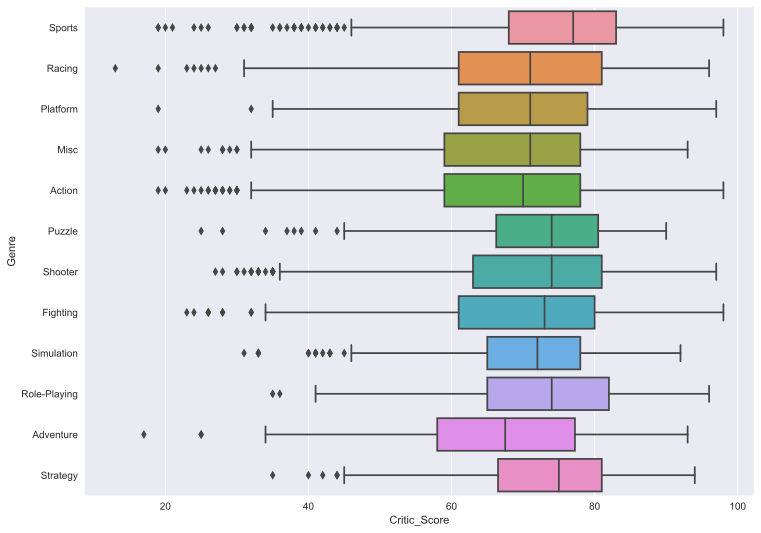

In [ ]:
plt.figure(figsize=(12, 9))
sns.boxplot(y="Genre", x="Critic_Score", data=df, orient="h")
plt.show()

При построении боксплотов мы хорошо визуализируем статистики, но теряем информацию о количестве наблюдений, на которых эти статистики оценивались. Для устранения этого недостатка можно воспользоваться способом, представленным ниже. Также для этого есть модифицированный боксплот - `violin plot`.

<AxesSubplot:xlabel='Critic_Score', ylabel='Genre'>

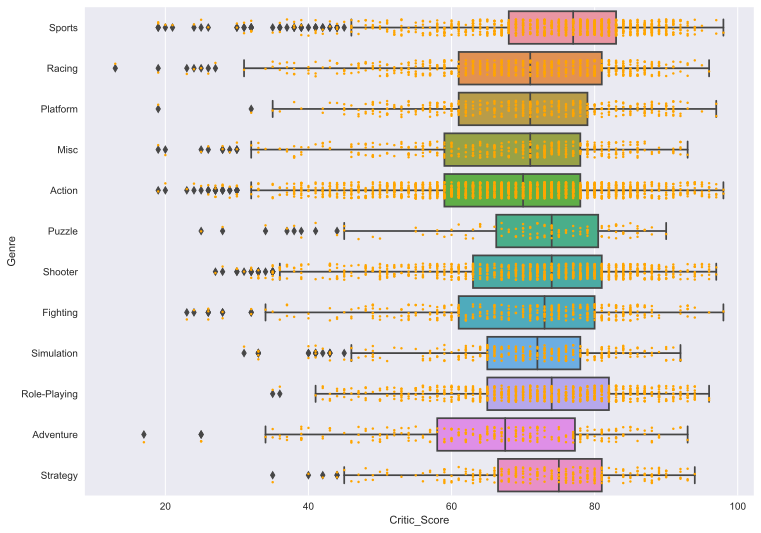

In [ ]:
plt.figure(figsize=(12, 9))
sns.boxplot(y="Genre", x="Critic_Score", data=df, orient="h")
sns.stripplot(y="Genre", x="Critic_Score", data=df, color="orange", jitter=0.2, size=2.5)

### Задание
  
__С помощью `boxplot` оцените распределение оценок пользователей для 7 самых популярных (больше всего пользователей) издателей (publisher).__

<AxesSubplot:xlabel='User_Score', ylabel='Publisher'>

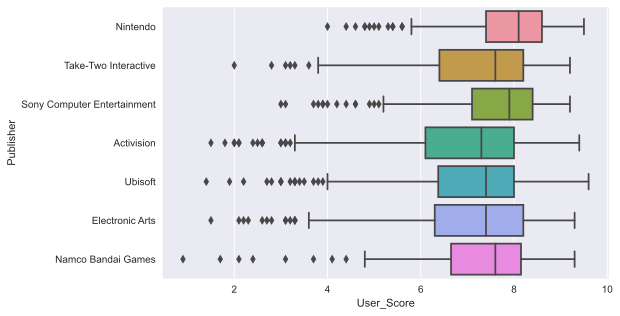

In [ ]:
popular_publishers = pd.crosstab(
    index=df.Publisher,
    columns=['Number_of_users'],
    values=df.User_Count,
    aggfunc='sum').sort_values('Number_of_users', ascending=False).head(7)

pop_pubs_names = list(popular_publishers.index)

df_popular = df[df.Publisher.apply(lambda pub: pub in pop_pubs_names)]

sns.boxplot(y=df_popular.Publisher, x="User_Score", data=df, orient="h")

## Визуализация зависимости <a name="depend"></a>

### Scatter plot <a name="scatter"></a>

Диаграмма рассеяния, по сути, визуализирует наблюдения в пространстве двух признаков. На основе распределения точек на графике можно сделать вывод, например, о зависимости признаков. 

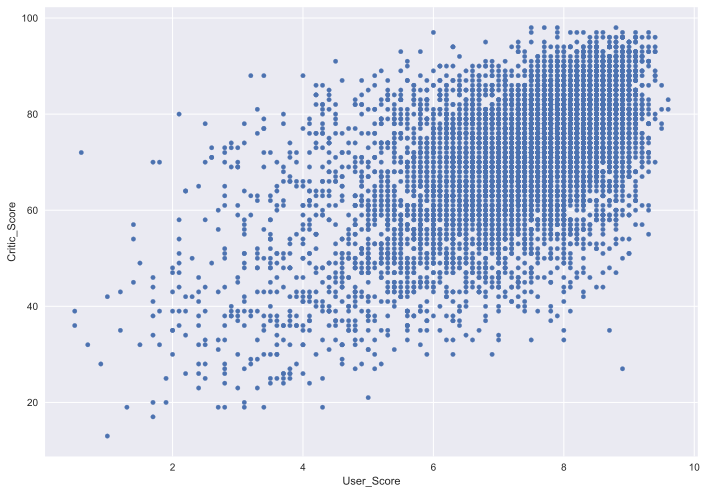

In [ ]:
df.plot.scatter(x='User_Score', y='Critic_Score', figsize=(11.7, 8.27))
plt.show()

На график можно добавить информацию о третьем признаке, например, через размер точек.

In [ ]:
df.plot.scatter(x='User_Score', y='Critic_Score', s=df.Global_Sales, figsize=(11.7, 8.27))
plt.show()

Или через цвет.

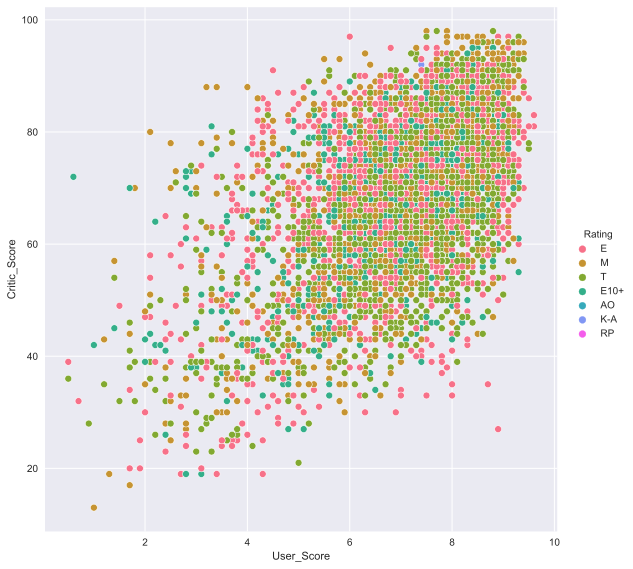

In [ ]:
sns.pairplot(x_vars='User_Score', y_vars='Critic_Score', data=df, hue="Rating", size=8)
plt.show()

Warning: ниже тяжелый график, может долго отрисовываться и съесть много ресурсов. 

In [ ]:
sns.pairplot(df[['NA_Sales', 
                'EU_Sales', 
                'JP_Sales', 
                'Other_Sales', 
                'Global_Sales', 
                'Critic_Score', 
                'Critic_Count', 
                'User_Score', 
                'User_Count']])

## Heatmap <a name="heat"></a>

Тепловые карты просто раскрашивают матрицу числовых значений, используя цветовую шкалу, построенную на основе значений в матрице. Так очень удобно оценивать корреляции между признаками. 

In [44]:
corr_mat = df[['NA_Sales', 
                 'EU_Sales', 
                 'JP_Sales', 
                 'Other_Sales', 
                 'Global_Sales', 
                 'Critic_Score', 
                 'Critic_Count', 
                 'User_Score', 
                 'User_Count']].corr()

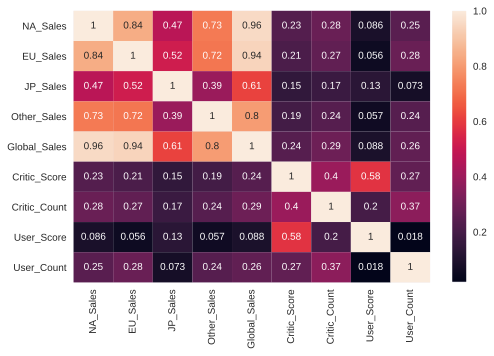

In [45]:
sns.heatmap(corr_mat, annot=True)
plt.ylim((corr_mat.shape[0], 0)) # fixes bug in matplotlib 3.1.1, should be removed in other versions
plt.show()

Также можно привизуализировать и сводные таблицы.

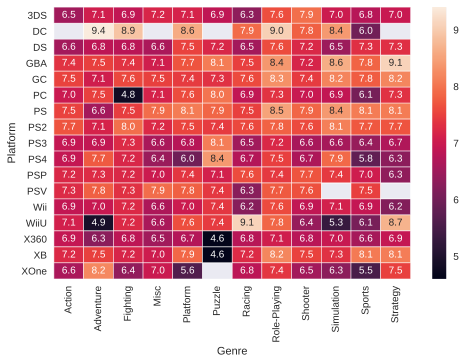

In [46]:
sns.heatmap(df.pivot_table(index='Platform', 
                           columns='Genre', 
                            values='User_Score', 
                            aggfunc=np.mean), 
            annot=True, fmt=".1f", linewidths=.5)
plt.ylim((df['Platform'].nunique(), 0)) # fixes bug in matplotlib 3.1.1, should be removed in other versions
plt.show()

## Несколько графиков на одном <a name="subplot"></a>

Просто демонстрация возможностей.

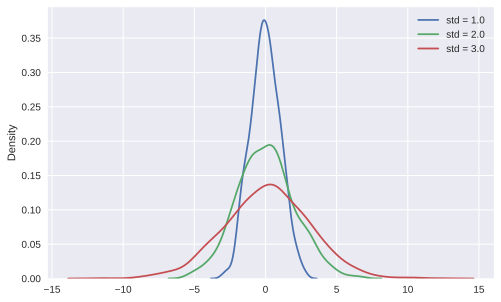

In [47]:
sns.distplot(np.random.normal(size=1000, scale=1.0), hist=False, label = "std = 1.0")
sns.distplot(np.random.normal(size=1000, scale=2.0), hist=False, label = "std = 2.0")
sns.distplot(np.random.normal(size=1000, scale=3.0), hist=False, label = "std = 3.0")
plt.legend(loc='best')
plt.show()

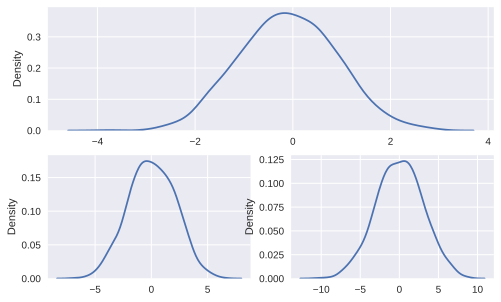

In [48]:
plt.subplot(2, 1, 1)
sns.distplot(np.random.normal(size=1000, scale=1.0), hist=False, label = "std = 1.0")

plt.subplot(2, 2, 3)
sns.distplot(np.random.normal(size=1000, scale=2.0), hist=False, label = "std = 2.0")

plt.subplot(2, 2, 4)
sns.distplot(np.random.normal(size=1000, scale=3.0), hist=False, label = "std = 3.0")

plt.show()

## Сохранение изображения <a name="save"></a>

In [50]:
from pylab import savefig

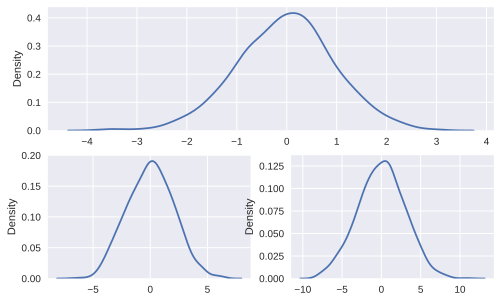

In [51]:
plt.subplot(2, 1, 1)
sns.distplot(np.random.normal(size=1000, scale=1.0), hist=False, label = "std = 1.0")

plt.subplot(2, 2, 3)
sns.distplot(np.random.normal(size=1000, scale=2.0), hist=False, label = "std = 2.0")

plt.subplot(2, 2, 4)
sns.distplot(np.random.normal(size=1000, scale=3.0), hist=False, label = "std = 3.0")

savefig('foo.pdf') # vectorized
savefig('foo.png') # rasterized
# чтобы удалить белые поля по бокам изображения, передайте аргумент bbox_inches='tight'

## Подписи осей <a name="labels"></a>

На многих графиках выше одна из осей или даже обе оставались без подписей. В таком случае сложно понять, что именно изображено на графике. Не надо так.  
Подписи можно задать с помощью функций `xlabel` и `ylabel`.

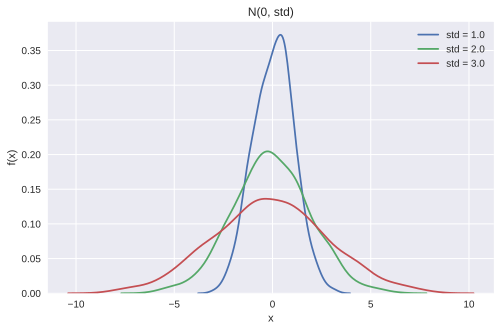

In [49]:
sns.distplot(np.random.normal(size=1000, scale=1.0), hist=False, label = "std = 1.0")
sns.distplot(np.random.normal(size=1000, scale=2.0), hist=False, label = "std = 2.0")
sns.distplot(np.random.normal(size=1000, scale=3.0), hist=False, label = "std = 3.0")

plt.xlabel('x')
plt.ylabel('f(x)')

plt.title("N(0, std)")

plt.legend(loc='best')
plt.show()